In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
data = pd.read_csv("./output_csv/features_added_keypoints_activity_v11s.csv")

In [3]:
print(data.columns.tolist())

['kp0_x', 'kp0_y', 'kp1_x', 'kp1_y', 'kp2_x', 'kp2_y', 'kp3_x', 'kp3_y', 'kp4_x', 'kp4_y', 'kp5_x', 'kp5_y', 'kp6_x', 'kp6_y', 'kp7_x', 'kp7_y', 'kp8_x', 'kp8_y', 'kp9_x', 'kp9_y', 'kp10_x', 'kp10_y', 'kp11_x', 'kp11_y', 'kp12_x', 'kp12_y', 'kp13_x', 'kp13_y', 'kp14_x', 'kp14_y', 'kp15_x', 'kp15_y', 'kp16_x', 'kp16_y', 'kp17_x', 'kp17_y', 'kp18_x', 'kp18_y', 'kp19_x', 'kp19_y', 'kp20_x', 'kp20_y', 'kp21_x', 'kp21_y', 'kp22_x', 'kp22_y', 'left_elbow_angle', 'right_elbow_angle', 'left_knee_angle', 'right_knee_angle', 'spine_curvature_angle', 'neck_angle', 'tail_angle', 'body_length', 'tail_length', 'nose_to_left_wrist_dist', 'nose_to_right_wrist_dist', 'wrist_distance', 'nose_to_left_ankle_dist', 'nose_to_right_ankle_dist', 'hind_paw_distance', 'nose_to_left_wrist_ratio', 'nose_to_right_wrist_ratio', 'hind_paw_distance_ratio', 'label']


In [4]:
data.head()

,kp0_x,kp0_y,kp1_x,kp1_y,kp2_x,kp2_y,kp3_x,kp3_y,kp4_x,kp4_y,...,nose_to_left_wrist_dist,nose_to_right_wrist_dist,wrist_distance,nose_to_left_ankle_dist,nose_to_right_ankle_dist,hind_paw_distance,nose_to_left_wrist_ratio,nose_to_right_wrist_ratio,hind_paw_distance_ratio,label
0,242.26190,235.43506,232.47087,230.92711,238.88330,225.35612,234.01470,236.27512,225.55386,231.24887,...,12.412186,26.694714,20.806310,37.449338,30.403163,28.450416,0.349843,0.752403,0.801888,grooming
1,242.16975,235.12062,232.59666,230.75040,238.93994,225.17096,234.21187,236.04510,225.73503,231.18646,...,12.161202,26.375917,20.564173,37.260714,30.253386,28.480001,0.340241,0.737935,0.796802,grooming
2,242.80298,235.21858,232.84505,230.83195,239.32144,225.19347,234.43575,236.14145,225.88782,231.21313,...,12.264865,26.988653,21.095850,37.950276,30.793586,28.653487,0.337613,0.742913,0.788741,grooming
3,242.03438,235.35550,231.95700,230.95518,238.39366,225.32587,233.61592,236.21179,225.05060,231.24628,...,12.352360,26.981102,20.959133,37.693789,30.884466,28.455322,0.342431,0.747967,0.788835,grooming
4,241.39919,235.14207,231.63634,230.80797,237.94846,225.35340,233.36699,236.04837,224.82384,231.00159,...,12.273694,26.476499,20.335741,36.885674,30.240681,27.387550,0.346069,0.746530,0.772218,grooming


In [5]:
print(data['label'].value_counts())

label
grooming      3720
standing      3270
scratching     756
Name: count, dtype: int64


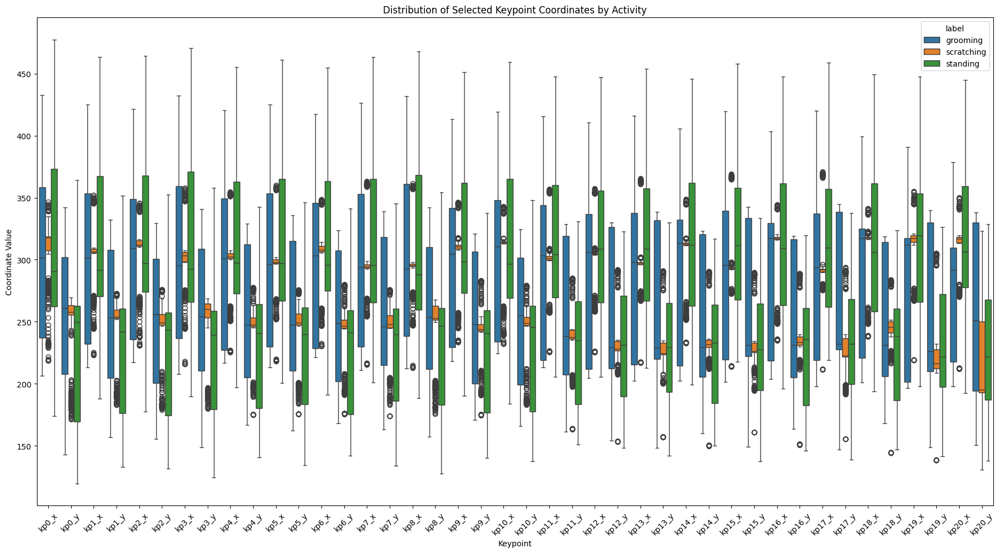

In [6]:
# Create a boxplot to visualize feature distribution by class
df_long = data.melt(id_vars=['label'], var_name='keypoint', value_name='value')

# Separate x and y coordinates
df_long['coord_type'] = df_long['keypoint'].apply(lambda x: 'x' if '_x' in x else 'y')
df_long['keypoint_id'] = df_long['keypoint'].apply(lambda x: x.split('_')[0])

# Visualize a few keypoints to avoid a cluttered plot
selected_keypoints = ['kp0','kp1','kp2','kp3','kp4','kp5','kp6','kp7','kp8','kp9','kp10','kp11', 'kp12','kp13','kp14','kp15','kp16','kp17','kp18','kp19', 'kp20', 'kp21' 'kp22']
df_filtered = df_long[df_long['keypoint_id'].isin(selected_keypoints)]

# Create a boxplot for x and y coordinates of selected keypoints
plt.figure(figsize=(18, 10))
sns.boxplot(data=df_filtered, x='keypoint', y='value', hue='label')
plt.title('Distribution of Selected Keypoint Coordinates by Activity')
plt.xlabel('Keypoint')
plt.ylabel('Coordinate Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('./csv_plots/features_added_keypoints_activity/distributions_keypoints_features_added_keypoints_activity.png')
plt.show()

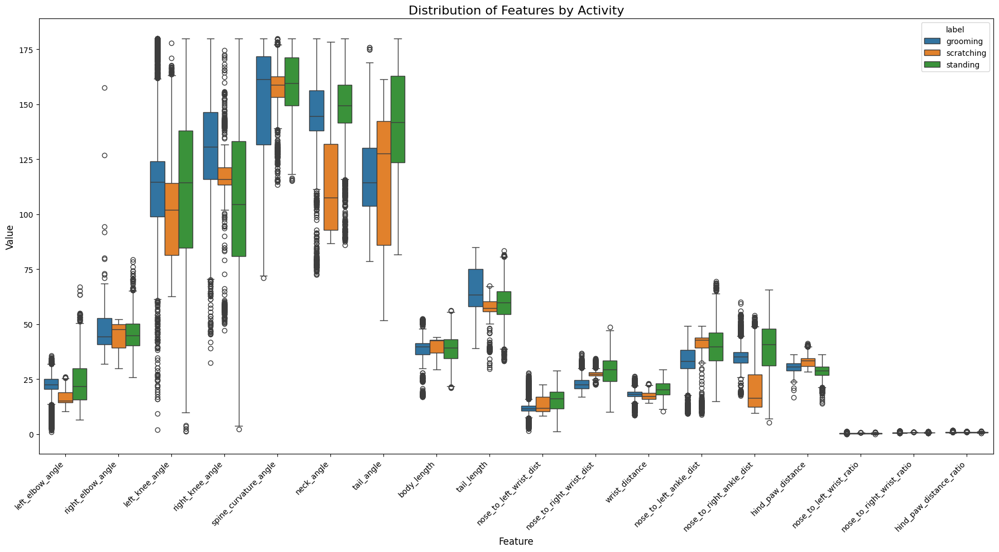

In [8]:
# List of the 18 features you want to plot
selected_features = [
    'left_elbow_angle', 'right_elbow_angle', 'left_knee_angle', 'right_knee_angle',
    'spine_curvature_angle', 'neck_angle', 'tail_angle', 'body_length', 'tail_length',
    'nose_to_left_wrist_dist', 'nose_to_right_wrist_dist', 'wrist_distance',
    'nose_to_left_ankle_dist', 'nose_to_right_ankle_dist', 'hind_paw_distance',
    'nose_to_left_wrist_ratio', 'nose_to_right_wrist_ratio', 'hind_paw_distance_ratio'
]

# Create a new DataFrame that contains only the features you want to plot and the 'label'
features_to_plot = data[selected_features + ['label']]

# Reshape the data into a "long" format, which is ideal for Seaborn
df_long = features_to_plot.melt(id_vars=['label'], var_name='feature', value_name='value')

# Create the Boxplot
plt.figure(figsize=(18, 10))
sns.boxplot(data=df_long, x='feature', y='value', hue='label')

# Customize the plot for better readability
plt.title('Distribution of Features by Activity', fontsize=16)
plt.xlabel('Feature', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()  
plt.savefig('./csv_plots/features_added_keypoints_activity/distributions_features_features_added_keypoints_activity.png')
plt.show()


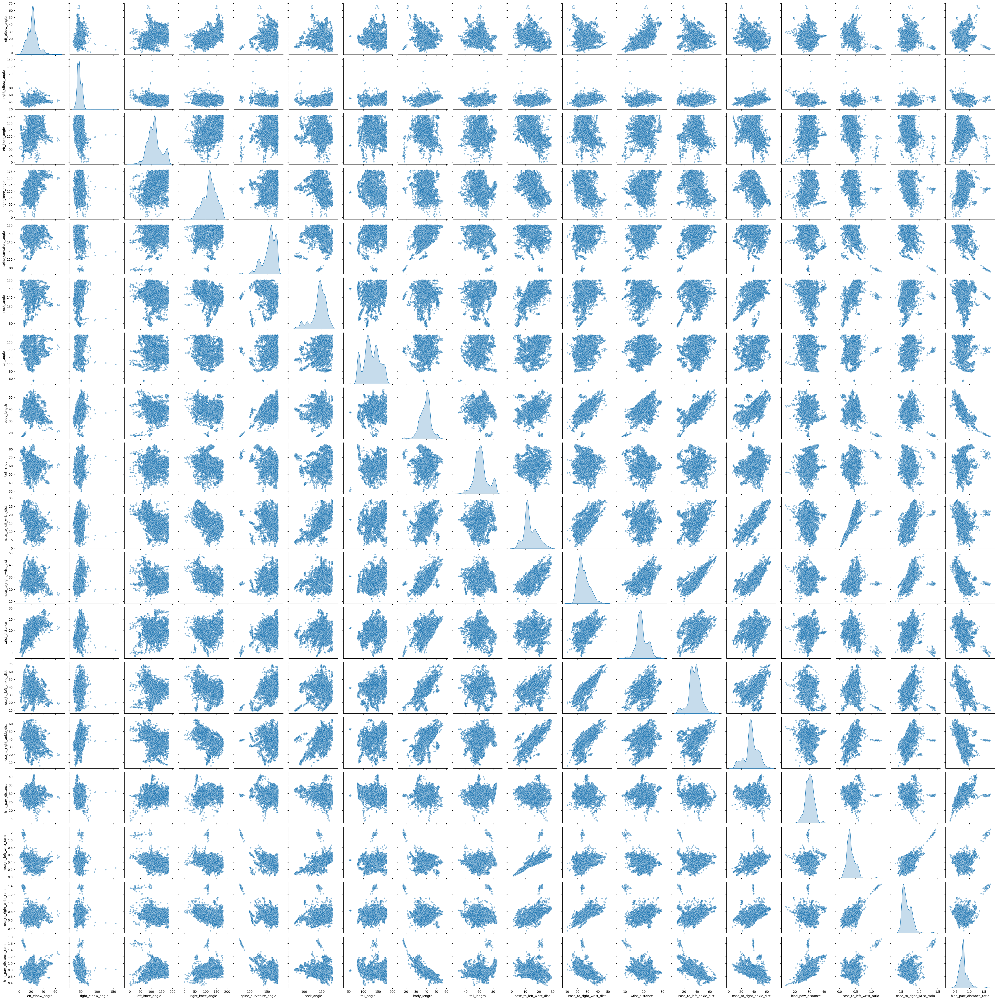

In [9]:
g = sns.pairplot(data[selected_features], diag_kind="kde", plot_kws={"alpha":0.5, "s":20})
g.savefig('./csv_plots/features_added_keypoints_activity/pair_plot_features_features_added_keypoints_activity.png')
plt.show()

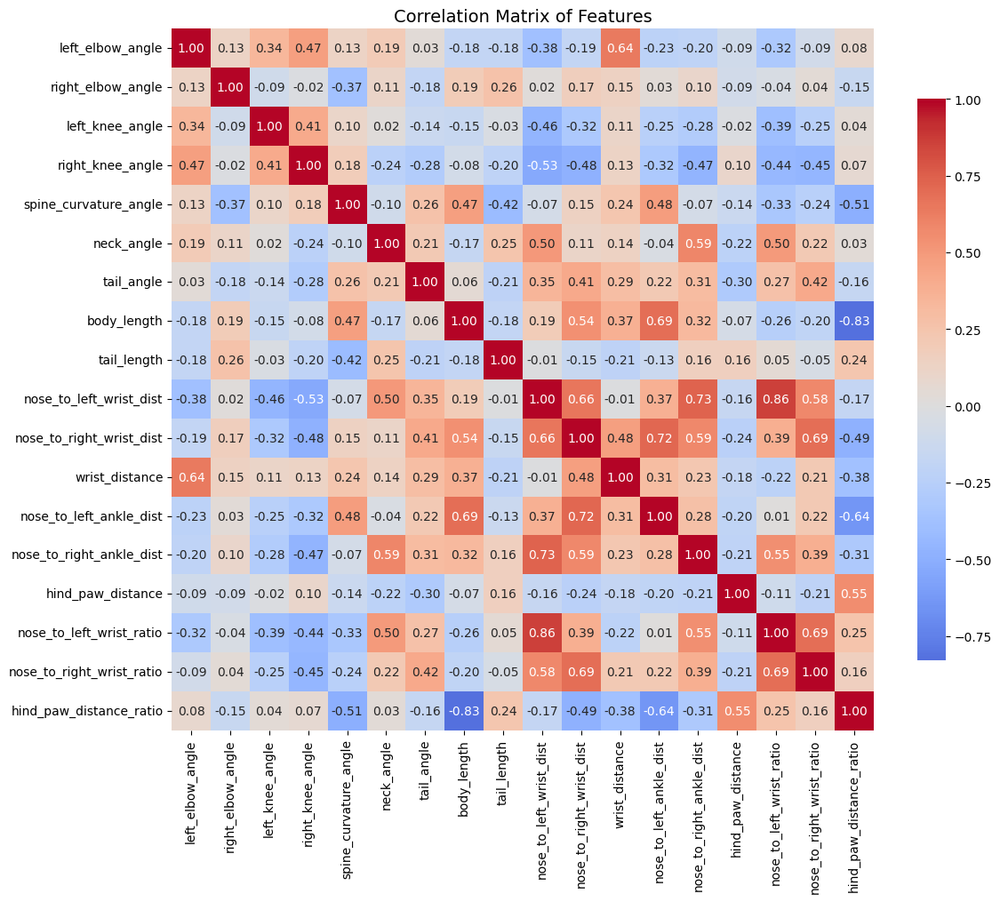

In [10]:
# Compute correlation matrix
features = data[selected_features]
corr = features.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(
    corr,
    annot=True,         # show correlation values
    fmt=".2f",          # format to 2 decimals
    cmap="coolwarm",    # color scheme
    center=0,
    square=True,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation Matrix of Features", fontsize=14)
plt.savefig("./csv_plots/features_added_keypoints_activity/correlation_matrix_features_added_keypoints_activity.png", dpi=300, bbox_inches="tight")
plt.tight_layout()
plt.show()

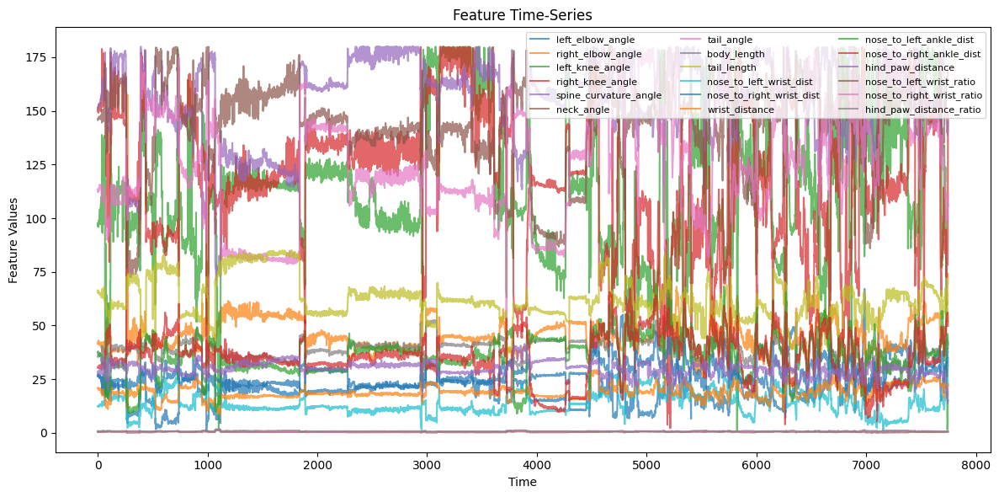

In [11]:
# Assume df has a 'time' column, if not use index
time = range(len(data))

plt.figure(figsize=(12, 6))
for col in features:   
    plt.plot(time, data[col], label=col, alpha=0.7)

plt.xlabel("Time")
plt.ylabel("Feature Values")
plt.title("Feature Time-Series")
plt.legend(loc="upper right", ncol=3, fontsize=8)
plt.tight_layout()
plt.savefig("./csv_plots/features_added_keypoints_activity/feature_timeseries_features_added_keypoints_activity.png")
plt.show()


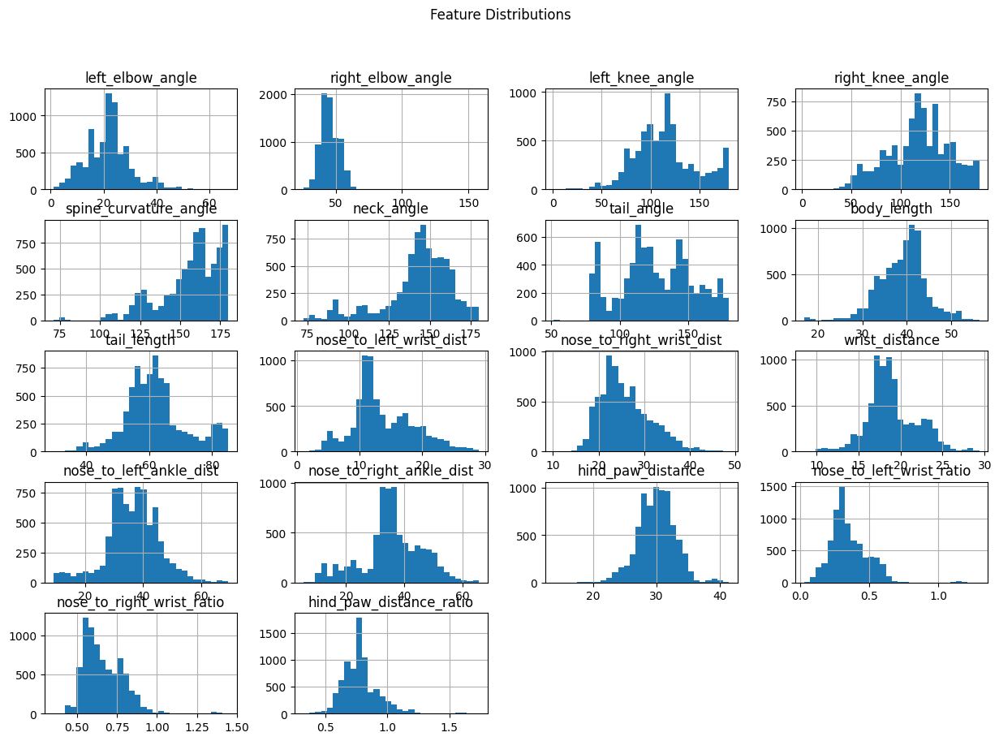

In [12]:
features.hist(bins=30, figsize=(15, 10))
plt.suptitle("Feature Distributions")
plt.xlabel("value")
plt.ylabel("counts")
plt.savefig("./csv_plots/features_added_keypoints_activity/feature_distributions_features_added_keypoints_activity.png")
plt.show()

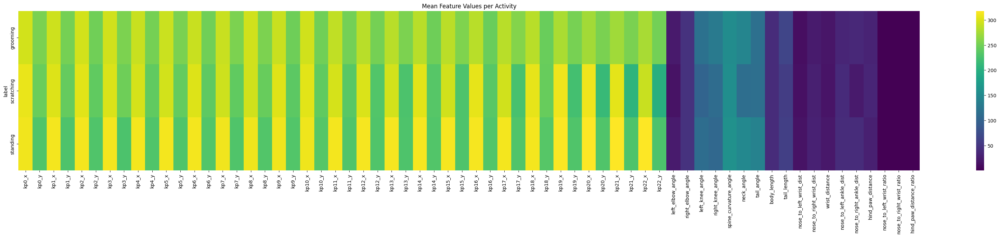

In [13]:
mean_features = data.groupby("label").mean()
plt.figure(figsize=(42, 6))
sns.heatmap(mean_features, annot=False, cmap="viridis")
plt.title("Mean Feature Values per Activity")
plt.savefig("./csv_plots/features_added_keypoints_activity/feature_mean_features_added_keypoints_activity.png")
plt.show()

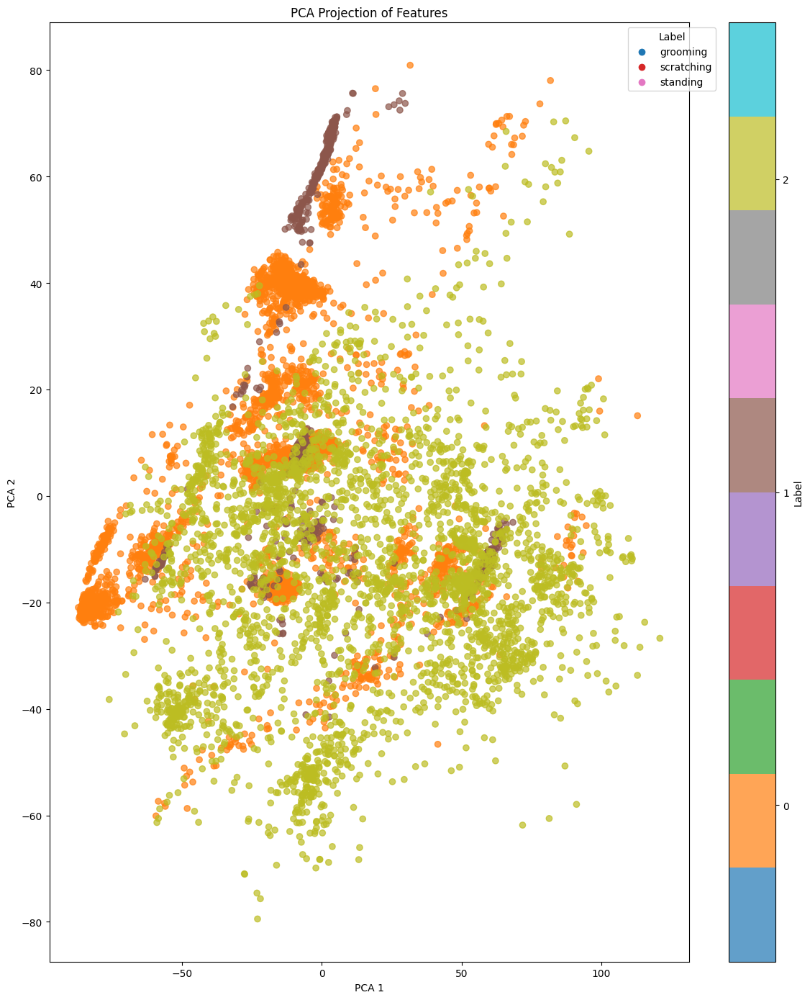

In [14]:
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA


labels = data["label"]

# Convert string labels to integers
le = LabelEncoder()
numeric_labels = le.fit_transform(labels) 

# PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)

# Scatter plot
plt.figure(figsize=(12, 14))
scatter = plt.scatter(
    pca_result[:,0],
    pca_result[:,1],
    c=numeric_labels,  
    cmap="tab10",
    alpha=0.7
)
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("PCA Projection of Features")

# Colorbar showing numeric labels
plt.colorbar(scatter, ticks=range(len(le.classes_)), label="Label")
plt.clim(-0.5, len(le.classes_)-0.5)

# Optional legend with original labels
for i, class_name in enumerate(le.classes_):
    plt.scatter([], [], color=plt.cm.tab10(i/len(le.classes_)), label=class_name)
plt.legend(title="Label", bbox_to_anchor=(1.05, 1), loc='upper right')

plt.tight_layout()
plt.savefig("./csv_plots/features_added_keypoints_activity/feature_PCA_projection_features_added_keypoints_activity.png")
plt.show()


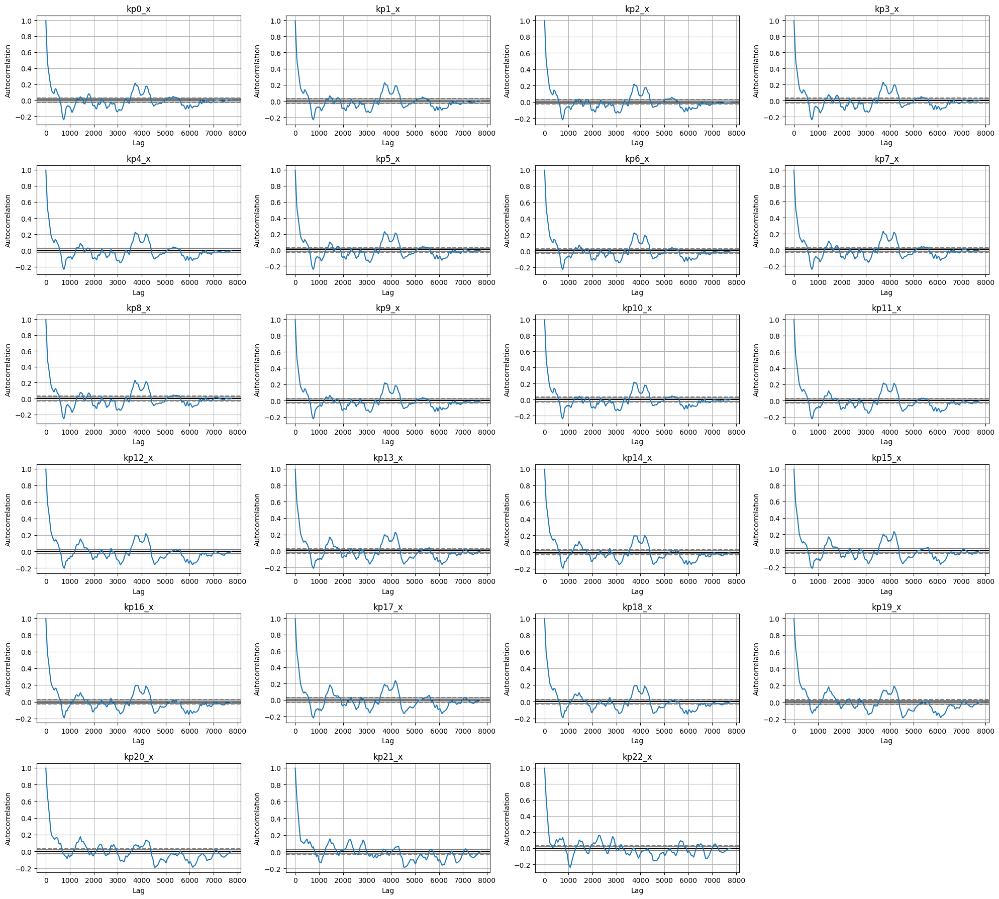

In [15]:
from pandas.plotting import autocorrelation_plot

num_features = 23
cols = 4  

# compute number of rows
rows = (num_features + cols - 1) // cols  

fig, axes = plt.subplots(rows, cols, figsize=(20, rows*3))
axes = axes.flatten()  

for key_idx in range(num_features):
    autocorrelation_plot(data[f"kp{key_idx}_x"], ax=axes[key_idx])
    axes[key_idx].set_title(f"kp{key_idx}_x")

# Turn off empty subplots (if num_features < rows*cols)
for i in range(num_features, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.savefig("./csv_plots/features_added_keypoints_activity/feature_dependence_overtime_features_added_keypoints_activity.png")
plt.show()